In [769]:
#@title Imports

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import os
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import imagenet_utils
from sklearn.model_selection import train_test_split

In [770]:
default_hyperparameters = {
    "hue_trim_left" : 0,
    "hue_trim_right" : 150,
    "sat_trim_left" : 3,
    "val_trim_left" : 10,
    "red_trim_perc_left" : 40,
    "red_trim_perc_right" : 100,
    "green_trim_perc_left" : 50,
    "green_trim_perc_right" : 100,
    "resize_width" : 400,
    "resize_height" : 400
}

hyperparameters = default_hyperparameters


In [771]:
# Data Cleaning Steps

def clean_data_hsv(img_data, hyperparams):
    img_data = np.array(img_data)
    h = img_data[:, :, 0]
    s = img_data[:, :, 1]
    v = img_data[:, :, 2]

    trim_hue_left = h <= hyperparams["hue_trim_left"] / 255
    trim_hue_right = h >= hyperparams["hue_trim_right"] / 255
    trim_sat_left = s < hyperparams["sat_trim_left"] / 255
    trim_val_left = v < hyperparams["val_trim_left"] / 255

    maskhue = np.logical_or(trim_hue_left, trim_hue_right)
    masksatval = np.logical_or(trim_sat_left, trim_val_left)
    maskimg = np.logical_or(maskhue, masksatval)

    img_data[maskimg] = 0

    return np.stack((h, s, v), axis=2)


def clean_data_rgb(img_data, hyperparams):
    img_data = np.array(img_data)
    r = img_data[:, :, 0]
    g = img_data[:, :, 1]
    b = img_data[:, :, 2]

    # Create masks for unwanted regions
    r_trim_left_bound = np.percentile(r, hyperparams["red_trim_perc_left"])
    r_trim_right_bound = np.percentile(r, hyperparams["red_trim_perc_right"])
    g_trim_left_bound = np.percentile(g, hyperparams["green_trim_perc_left"])
    g_trim_right_bound = np.percentile(g, hyperparams["green_trim_perc_right"])

    trim_red_left_mask = r <= r_trim_left_bound
    trim_red_right_mask = r >= r_trim_right_bound
    trim_green_left_mask = g <= g_trim_left_bound
    trim_green_right_mask = g >= g_trim_right_bound

    trim_red_mask = np.logical_or(trim_red_left_mask, trim_red_right_mask)
    trim_green_mask = np.logical_or(trim_green_left_mask, trim_green_right_mask)
    trim_mask = np.logical_or(trim_red_mask, trim_green_mask)

    img_data[trim_mask] = 0
    
    # Discard blue channel
    b[:, :] = 0

    # Normalize values
    min_r = np.min(r)
    r = r - min_r
    max_r = np.max(r)

    r = r * ((r / max_r) * 255)

    min_g = np.min(g)
    g = g - min_g
    max_g = np.max(g)

    g = g * ((g / max_g) * 180)

    print(r)

    return np.stack((r, g, b), axis=2)

# Define Data Cleaning Procedure
def clean_image(img_input, hyperparams):
    img_arr = image.img_to_array(img_input)
    hsv_arr = tf.image.rgb_to_hsv(img_arr)
    hsv_arr = clean_data_hsv(hsv_arr, hyperparams)
    rgb_arr = tf.image.hsv_to_rgb(hsv_arr)
    rgb_arr = clean_data_rgb(rgb_arr, hyperparams)
    img_out = image.array_to_img(rgb_arr)
    return img_out
    


In [772]:
ex_img = image.load_img("data/sick/DJI_0035.jpg")


In [773]:
ex_img_clean = clean_image(ex_img, hyperparameters)

[[   0.        0.        0.     ... 4165.     5271.329  4315.0776]
 [   0.        0.        0.     ...    0.     4315.0776 4941.953 ]
 [   0.        0.        0.     ... 4017.5781 6695.078  6885.    ]
 ...
 [   0.        0.        0.     ... 7077.578  8500.     7470.703 ]
 [   0.        0.        0.     ... 6695.078  5961.953  6507.8125]
 [   0.        0.        0.     ... 5105.3125 4781.25   4941.953 ]]


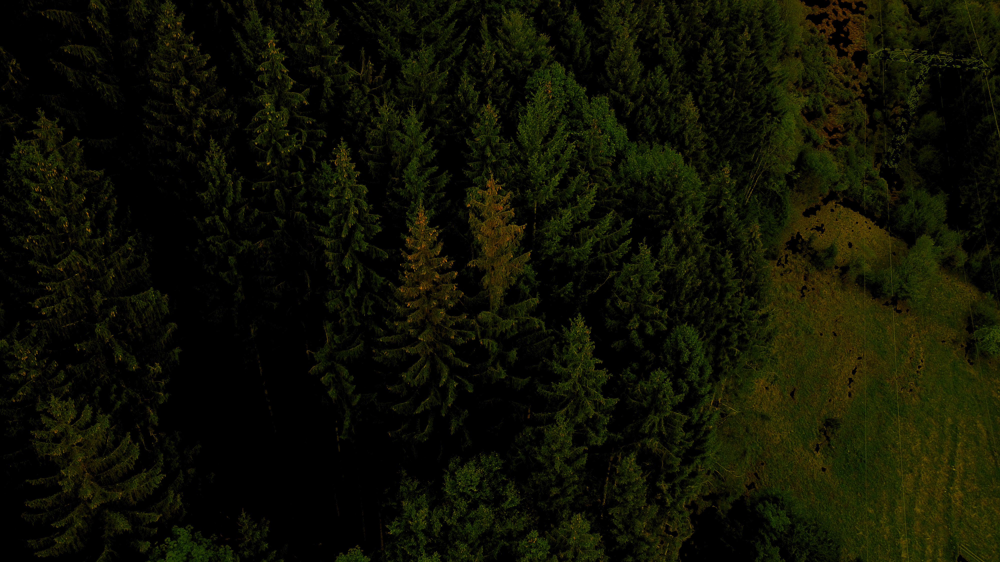

In [774]:
ex_img_clean